In [ ]:
!pip install geopandas

Merhabalar, öncelikle bugünkü proje konuma biraz değinmek istiyorum, ardından bu notebook boyunca karşılaşacağımız içeriklere dair ufak bilgiler verip, daha sonra detaylandıracağım.

Bu Veri Analizi projesinin amacı, İzmir'deki Acil Durum Toplanma Alanları'nın yer bilgilerini, adeti gibi bilgileri aynı zamanda bazen interaktif bir şekilde, çeşitli görselleştirme yöntemleri kullanarak analiz etmekti. Görselleştirme için kullandığım başlıca kütüphaneler de GeoPandas ve Plotly oldu.

Verilerimden ilkini, İzmir Büyükşehir Belediyesi Açık Veri Portalı'ndan .csv formatı ile indirdim, ikinci verim olan, coğrafi konum bilgilerini içeren klasörü de "https://data.humdata.org/" bağlantılı siteden indirdim. Tabii buradaki veri Türkiye'deki bütün idari bölgelerin sınırlarını içeren bir veriydi ama daha sonrada göreceğimiz üzere bu veriden sadece İzmir'e özel bir filtreleme yapmak mümkün.

Projemizin adımlarını sıralayacak olursak;

1) Öncelikle IBB Veri Portalı'ndan indirdiğimiz "acil_durum_alani.csv" adlı dosyayı anlayıp, gerekli haritalandırmalar ve tablolar için işimize yarayacak şekilde oynamalar yapıyoruz.
2) Ardından Folium kütüphanesini kullanarak görmek istediğimiz ilçe ve mahallenin input'unu giriyoruz ki böylece haritayı yorumlamamız çok daha kolay ve manuel hale gelmiş oluyor.
3) Bu noktaların ısı haritasını oluşturuyoruz. Ardından harita üzerinde bu toplanma alanlarının dağılımlarını ve sayısal adetini incelemek için Marker Cluster kullanarak bir haritalandırma daha yapıyoruz.
4) Bu adımda ise Choropleth haritası kullanacağız. Choropleth nedir? Bir bölgenin siyasi haritası diyebiliriz. İlgili bölge verisinin sınırlarını .shp uzantılı bir veriseti içinde tutar ve burada "geometry" adında bir kolon bulunur, bu kolon, içinde polygon veya linestring barındırır ve bunlar enlem-boylam bilgilerinden oluşur.
5) İlgili .shp uzantılı dosyayı okuduktan sonra, işimize yarayacak filtreleme işlemlerini yaparız ve böylece Choropleth haritamız için coğrafi verilerimiz hazır hale gelir.
6) Bu adımdan sonra ise Plotly kütüphanemiz yardımıyla verilerimizin tablolarını ve treemap'ini çizerek onu anlamlandırmaya devam edeceğiz.

Ön bilgilendirmemizi yaptığımıza göre başlayabiliriz.

In [ ]:
import pandas as pd
import geopandas as gpd

In [ ]:
df = pd.read_csv('/content/acil_durum_alani_izmir.csv')

In [ ]:
df.head()

,_id,ILCE,KAPINO,ENLEM,ACIKLAMA,ILCEID,MAHALLE,MAHALLEID,ADI,BOYLAM,YOL
0,1,ALİAĞA,NaN,38.882542,NaN,3,YENİŞAKRAN,NaN,Aliağa Afet ve Acil Durum Toplanma Alanı,27.065505,NaN
1,2,ALİAĞA,NaN,38.774595,NaN,3,UZUNHASANLAR,NaN,Aliağa Afet ve Acil Durum Toplanma Alanı,27.083296,NaN
2,3,ALİAĞA,NaN,38.795387,NaN,3,ATATÜRK,NaN,Aliağa Afet ve Acil Durum Toplanma Alanı,26.965196,NaN
3,4,ALİAĞA,NaN,38.701807,NaN,3,B.HAYRETTİN PAŞA,NaN,Aliağa Afet ve Acil Durum Toplanma Alanı,27.019168,NaN
4,5,ALİAĞA,NaN,38.867270,NaN,3,HACIÖMERLİ,NaN,Aliağa Afet ve Acil Durum Toplanma Alanı,27.061574,NaN


Alttaki hücrede enlem ve boylam bilgilerimde null ifade var mı onu kontrol ediyorum.

In [ ]:
print(df[['ENLEM', 'BOYLAM']].isnull().any())

ENLEM     False
BOYLAM    False
dtype: bool


Aynı şekilde bütün dataframe için denedim.

In [ ]:
print(df.isnull().any())

_id          False
ILCE         False
KAPINO        True
ENLEM        False
ACIKLAMA      True
ILCEID       False
MAHALLE      False
MAHALLEID     True
ADI          False
BOYLAM       False
YOL           True
dtype: bool


Alttaki yorum satırlarında, verilerimde herhangi bir düzenleme yapmak istersem, kullanmak amaçlı birkaç işlem uyguladım. Örneğin, verimdeki ilçe isimlerinin sadece baş harfini büyük yapmak isteseydim bu yolları izleyecektim ama gerek görmedim çünkü daha sonra göreceğimiz .shp dosyam ve şuanki dosyamın indeks bilgilerini uyumlu bir hale getirmek için bu yolu izlemek kullanışsız olurdu.

In [ ]:
#df['ILCE'].str.lower()

In [ ]:
#a = df['ILCE'].str[0].str.upper()

In [ ]:
#print(a + df['ILCE'].str[1:].str.lower())

In [ ]:
#df['ILCE'] = a + df['ILCE'].str[1:].str.lower()

In [ ]:
df

,_id,ILCE,KAPINO,ENLEM,ACIKLAMA,ILCEID,MAHALLE,MAHALLEID,ADI,BOYLAM,YOL
0,1,ALİAĞA,NaN,38.882542,NaN,3,YENİŞAKRAN,NaN,Aliağa Afet ve Acil Durum Toplanma Alanı,27.065505,NaN
1,2,ALİAĞA,NaN,38.774595,NaN,3,UZUNHASANLAR,NaN,Aliağa Afet ve Acil Durum Toplanma Alanı,27.083296,NaN
2,3,ALİAĞA,NaN,38.795387,NaN,3,ATATÜRK,NaN,Aliağa Afet ve Acil Durum Toplanma Alanı,26.965196,NaN
3,4,ALİAĞA,NaN,38.701807,NaN,3,B.HAYRETTİN PAŞA,NaN,Aliağa Afet ve Acil Durum Toplanma Alanı,27.019168,NaN
4,5,ALİAĞA,NaN,38.867270,NaN,3,HACIÖMERLİ,NaN,Aliağa Afet ve Acil Durum Toplanma Alanı,27.061574,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1638,1639,URLA,NaN,38.228551,NaN,18,DEMİRCİLİ,NaN,Urla Afet ve Acil Durum Toplanma Alanı,26.686869,NaN
1639,1640,URLA,NaN,38.298871,NaN,18,NOHUTALAN,NaN,Urla Afet ve Acil Durum Toplanma Alanı,26.525551,NaN
1640,1641,URLA,NaN,38.324379,NaN,18,ALTINTAŞ,NaN,Urla Afet ve Acil Durum Toplanma Alanı,26.757995,NaN
1641,1642,URLA,NaN,38.331348,NaN,18,YENİKENT,NaN,Urla Afet ve Acil Durum Toplanma Alanı,26.768912,NaN


Alttaki satırda, NaN değerlere sahip olduğunu bildiğim kolonları direkt olarak siliyorum.

In [ ]:
df = df.drop(df.columns[[2, 4, 7, -1]], axis=1)

In [ ]:
df

,_id,ILCE,ENLEM,ILCEID,MAHALLE,ADI,BOYLAM
0,1,ALİAĞA,38.882542,3,YENİŞAKRAN,Aliağa Afet ve Acil Durum Toplanma Alanı,27.065505
1,2,ALİAĞA,38.774595,3,UZUNHASANLAR,Aliağa Afet ve Acil Durum Toplanma Alanı,27.083296
2,3,ALİAĞA,38.795387,3,ATATÜRK,Aliağa Afet ve Acil Durum Toplanma Alanı,26.965196
3,4,ALİAĞA,38.701807,3,B.HAYRETTİN PAŞA,Aliağa Afet ve Acil Durum Toplanma Alanı,27.019168
4,5,ALİAĞA,38.867270,3,HACIÖMERLİ,Aliağa Afet ve Acil Durum Toplanma Alanı,27.061574
...,...,...,...,...,...,...,...
1638,1639,URLA,38.228551,18,DEMİRCİLİ,Urla Afet ve Acil Durum Toplanma Alanı,26.686869
1639,1640,URLA,38.298871,18,NOHUTALAN,Urla Afet ve Acil Durum Toplanma Alanı,26.525551
1640,1641,URLA,38.324379,18,ALTINTAŞ,Urla Afet ve Acil Durum Toplanma Alanı,26.757995
1641,1642,URLA,38.331348,18,YENİKENT,Urla Afet ve Acil Durum Toplanma Alanı,26.768912


In [ ]:
df.isnull().any()

_id        False
ILCE       False
ENLEM      False
ILCEID     False
MAHALLE    False
ADI        False
BOYLAM     False
dtype: bool

In [ ]:
df['ILCEID']

0        3
1        3
2        3
3        3
4        3
        ..
1638    18
1639    18
1640    18
1641    18
1642    18
Name: ILCEID, Length: 1643, dtype: int64

In [ ]:
df['ILCE'].value_counts()

KEMALPAŞA      148
BERGAMA        128
KARŞIYAKA      114
ÖDEMİŞ         101
TİRE            99
KARABAĞLAR      92
MENEMEN         69
ÇEŞME           67
NARLIDERE       66
KİRAZ           64
GÜZELBAHÇE      63
BUCA            59
BORNOVA         52
ÇİĞLİ           51
KINIK           51
BAYINDIR        39
ALİAĞA          39
GAZİEMİR        38
DİKİLİ          37
KONAK           36
BEYDAĞ          35
BAYRAKLI        34
URLA            32
SELÇUK          31
TORBALI         24
KARABURUN       17
MENDERES        16
BALÇOVA         15
SEFERİHİSAR     14
FOÇA            12
Name: ILCE, dtype: int64

In [ ]:
import folium
from folium import Choropleth, Circle, Marker
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

Hemen alttaki kısımda, görselleştirme yapmak istediğim ilçe ve mahalleyi kendim belirlemek için input verdim ve bu şekilde seçtiğim ilçe ve mahallenin renkleri hem birbirinden farklı olacak hem de şehirin geri kalanından. Bunu interaktif bir şekilde kendim belirlemek istediğim için bu yolu izledim.

In [ ]:
A = input('Lütfen ilçenizi giriniz: ')

Lütfen ilçenizi giriniz: KARABAĞLAR


Bu hücrede ve ileride kullanacağım pekçok hücrede, "loc" ve "iloc" gibi metodlar ile çağırmak istediğim kolonları indeks olarak belirliyorum.

In [ ]:
df_new = df.set_index('ILCE')

In [ ]:
df_new.loc[A]

,_id,ENLEM,ILCEID,MAHALLE,ADI,BOYLAM
ILCE,,,,,,
KARABAĞLAR,670,38.391817,19,OSMAN AKSÜNER,Karabağlar Afet ve Acil Durum Toplanma Alanı,27.134990
KARABAĞLAR,671,38.383309,19,ALİ FUAT CEBESOY,Karabağlar Afet ve Acil Durum Toplanma Alanı,27.104937
KARABAĞLAR,672,38.359430,19,PEKER,Karabağlar Afet ve Acil Durum Toplanma Alanı,27.124977
KARABAĞLAR,673,38.392469,19,KAZIM KARABEKİR,Karabağlar Afet ve Acil Durum Toplanma Alanı,27.114889
KARABAĞLAR,674,38.387857,19,REFET BELE,Karabağlar Afet ve Acil Durum Toplanma Alanı,27.110503
...,...,...,...,...,...,...
KARABAĞLAR,757,38.393812,19,ESENYALI,Karabağlar Afet ve Acil Durum Toplanma Alanı,27.093201
KARABAĞLAR,758,38.391856,19,ESENYALI,Karabağlar Afet ve Acil Durum Toplanma Alanı,27.091118
KARABAĞLAR,759,38.392686,19,ESENYALI,Karabağlar Afet ve Acil Durum Toplanma Alanı,27.090624


In [ ]:
df_new

,_id,ENLEM,ILCEID,MAHALLE,ADI,BOYLAM
ILCE,,,,,,
ALİAĞA,1,38.882542,3,YENİŞAKRAN,Aliağa Afet ve Acil Durum Toplanma Alanı,27.065505
ALİAĞA,2,38.774595,3,UZUNHASANLAR,Aliağa Afet ve Acil Durum Toplanma Alanı,27.083296
ALİAĞA,3,38.795387,3,ATATÜRK,Aliağa Afet ve Acil Durum Toplanma Alanı,26.965196
ALİAĞA,4,38.701807,3,B.HAYRETTİN PAŞA,Aliağa Afet ve Acil Durum Toplanma Alanı,27.019168
ALİAĞA,5,38.867270,3,HACIÖMERLİ,Aliağa Afet ve Acil Durum Toplanma Alanı,27.061574
...,...,...,...,...,...,...
URLA,1639,38.228551,18,DEMİRCİLİ,Urla Afet ve Acil Durum Toplanma Alanı,26.686869
URLA,1640,38.298871,18,NOHUTALAN,Urla Afet ve Acil Durum Toplanma Alanı,26.525551
URLA,1641,38.324379,18,ALTINTAŞ,Urla Afet ve Acil Durum Toplanma Alanı,26.757995


In [ ]:
df_new1 = df_new.set_index('MAHALLE')
df_new1

,_id,ENLEM,ILCEID,ADI,BOYLAM
MAHALLE,,,,,
YENİŞAKRAN,1,38.882542,3,Aliağa Afet ve Acil Durum Toplanma Alanı,27.065505
UZUNHASANLAR,2,38.774595,3,Aliağa Afet ve Acil Durum Toplanma Alanı,27.083296
ATATÜRK,3,38.795387,3,Aliağa Afet ve Acil Durum Toplanma Alanı,26.965196
B.HAYRETTİN PAŞA,4,38.701807,3,Aliağa Afet ve Acil Durum Toplanma Alanı,27.019168
HACIÖMERLİ,5,38.867270,3,Aliağa Afet ve Acil Durum Toplanma Alanı,27.061574
...,...,...,...,...,...
DEMİRCİLİ,1639,38.228551,18,Urla Afet ve Acil Durum Toplanma Alanı,26.686869
NOHUTALAN,1640,38.298871,18,Urla Afet ve Acil Durum Toplanma Alanı,26.525551
ALTINTAŞ,1641,38.324379,18,Urla Afet ve Acil Durum Toplanma Alanı,26.757995


In [ ]:
B = input('Lütfen mahallenizi giriniz: ')

Lütfen mahallenizi giriniz: FAHRETTİN ALTAY


In [ ]:
for i in range(0, len(df['MAHALLE'])):
    if df_new['MAHALLE'].iloc[i] == B:
      print('a')

a
a
a
a


Gördüğünüz gibi, alt hücrede yer alan haritada, seçtiğim ilçe olan Karabağlar kırmızı renkte, seçtiğim mahalle olan Fahrettin Altay ise mavi renkte görünmekte. Kalan toplanma alanları ise color_product fonksiyonumdaki koşulları sağlamadığı için yeşil renkte görünmekte. Dilerseniz çember üzerine tıklayarak da mahalle ve konum bilgilerini öğrenebilirsiniz.

In [ ]:
m_1 = folium.Map(location=[38.41273,  27.13838], tiles = 'cartodbpositron', zoom_control=6)


def color_product():
   if df['ILCE'].iloc[i] == A:
       if df_new['MAHALLE'].iloc[i] == B:
          return 'blue'
       return 'red'
   else:
      return 'darkgreen'


for i in range(0, len(df['ILCE'])):
  label = '{}, {}, {}, {}'.format(df['ILCE'].iloc[i], df['MAHALLE'].iloc[i], df['ENLEM'].iloc[i], df['BOYLAM'].iloc[i])
  Circle([df['ENLEM'].iloc[i], df['BOYLAM'].iloc[i]], radius=10, popup = label, color=color_product()).add_to(m_1)
m_1

Alttaki hücrede yer alan ısı haritasını ise, yukarıda yer alan harita üzerinden oluşturdum. Böylelikle hem verinin ısı analizini yapabileceğiz hem de çemberlere dokunduğumuzda konum bilgilerini kolayca öğrenebileceğiz.

In [ ]:
df_heat = df[['ENLEM', 'BOYLAM']]
df_np = df_heat.to_numpy()

m_3 = folium.Map(location=[38.41273, 27.13838], tiles='cartodbpositron', zoom_start=6)
HeatMap(data=df_np, radius=20).add_to(m_1)

m_1

In [ ]:
import math

Bu hücrede ise hem toplam toplanma yeri sayısını harita üzerinde sayısal olarak görmek hem de dağılımlarını daha rahat analiz etmek için Marker Cluster kullandım ve bunun için de math kütüphanesini import ettim.

In [ ]:
m_8 = folium.Map(location=[38.41273, 27.13838], tiles='cartodbdark_matter', zoom_start=6)

mc = MarkerCluster()

for idx, row in df.iterrows():
    label = '{}, {}'.format(row['MAHALLE'], row['ILCE'])
    if not math.isnan(row['BOYLAM']) and not math.isnan(row['ENLEM']):
        mc.add_child(Marker([row['ENLEM'], row['BOYLAM']], popup=label))
m_8.add_child(mc)
m_8

Buradan itibaren, yeni bir klasör kullanmaya başlıyoruz ve daha sonra da bu klasörde yer alan "tur_polbna_adm2.shp" dosyasını, çeşitli satır ve sütun işlemleri kullandıktan sonra önceki dosyamız olan .csv uzantılı dosya ile ortak indeksler yardımı ile eşleştireceğiz. Böylelikle, oluşturacağım Choropleth haritasında hem ilçe sınırlarını elde etmiş olacağım hem de toplanma yerleri sayılarına göre de bu haritada renklendirme çalışmaları yapabileceğim.

In [ ]:
df_adm = gpd.read_file('/content/tur_polbna_adm2.shp')

In [ ]:
df_adm = df_adm.set_index('adm1_tr')

Öncelikle, dosyamızın içeriğinde bütün Türkiye'nin ilçelerinin sınır bilgileri yer almakta. O yüzden önce ilçe isimlerini indeks olarak belirleyip ardından "loc" yardımı ile içlerinden sadece İzmir'de bulunan ilçelere özel yeni bir dataframe yaratıyorum.

In [ ]:
df_izmir = df_adm.loc['İZMİR'].copy()

In [ ]:
df_izmir

,OBJECTID,adm2_tr,adm2_en,adm1_en,adm1,pcode,Shape_Leng,Shape_Area,geometry
adm1_tr,,,,,,,,,
İZMİR,2,ÇİĞLİ,CIGLI,IZMIR,TUR035,TUR035010,1.138818,0.014430,"POLYGON ((27.06797 38.46423, 27.06785 38.46418..."
İZMİR,99,ALİAĞA,ALIAGA,IZMIR,TUR035,TUR035001,1.564311,0.039342,"MULTIPOLYGON (((26.88506 38.85473, 26.88596 38..."
İZMİR,220,BALÇOVA,BALCOVA,IZMIR,TUR035,TUR035002,0.282493,0.001588,"MULTIPOLYGON (((27.05975 38.41520, 27.06006 38..."
İZMİR,231,BAYINDIR,BAYINDIR,IZMIR,TUR035,TUR035003,1.105323,0.056379,"POLYGON ((27.81550 38.33113, 27.81159 38.32612..."
İZMİR,233,BAYRAKLI,BAYRAKLI,IZMIR,TUR035,TUR035004,0.357651,0.003100,"POLYGON ((27.18078 38.44803, 27.17771 38.44694..."
İZMİR,242,BERGAMA,BERGAMA,IZMIR,TUR035,TUR035005,2.269019,0.160788,"POLYGON ((27.18320 39.36502, 27.18488 39.36467..."
İZMİR,246,BEYDAĞ,BEYDAG,IZMIR,TUR035,TUR035006,0.580816,0.017642,"POLYGON ((28.21052 38.02825, 28.20955 38.02862..."
İZMİR,264,BORNOVA,BORNOVA,IZMIR,TUR035,TUR035007,0.778574,0.022721,"POLYGON ((27.18385 38.51305, 27.18462 38.51487..."
İZMİR,275,BUCA,BUCA,IZMIR,TUR035,TUR035008,0.677499,0.018338,"POLYGON ((27.13928 38.36124, 27.13952 38.36151..."


Altta da gördüğünüz gibi plot'ta gördüğümüz sınır bilgileri İzmir'in ilçelerine ait.

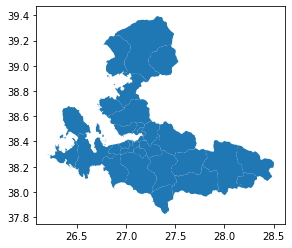

In [ ]:
df_izmir.plot()

In [ ]:
df_izmir = df_izmir.set_index('adm2_tr')

In [ ]:
df_izmir

,OBJECTID,adm2_en,adm1_en,adm1,pcode,Shape_Leng,Shape_Area,geometry
adm2_tr,,,,,,,,
ÇİĞLİ,2,CIGLI,IZMIR,TUR035,TUR035010,1.138818,0.014430,"POLYGON ((27.06797 38.46423, 27.06785 38.46418..."
ALİAĞA,99,ALIAGA,IZMIR,TUR035,TUR035001,1.564311,0.039342,"MULTIPOLYGON (((26.88506 38.85473, 26.88596 38..."
BALÇOVA,220,BALCOVA,IZMIR,TUR035,TUR035002,0.282493,0.001588,"MULTIPOLYGON (((27.05975 38.41520, 27.06006 38..."
BAYINDIR,231,BAYINDIR,IZMIR,TUR035,TUR035003,1.105323,0.056379,"POLYGON ((27.81550 38.33113, 27.81159 38.32612..."
BAYRAKLI,233,BAYRAKLI,IZMIR,TUR035,TUR035004,0.357651,0.003100,"POLYGON ((27.18078 38.44803, 27.17771 38.44694..."
BERGAMA,242,BERGAMA,IZMIR,TUR035,TUR035005,2.269019,0.160788,"POLYGON ((27.18320 39.36502, 27.18488 39.36467..."
BEYDAĞ,246,BEYDAG,IZMIR,TUR035,TUR035006,0.580816,0.017642,"POLYGON ((28.21052 38.02825, 28.20955 38.02862..."
BORNOVA,264,BORNOVA,IZMIR,TUR035,TUR035007,0.778574,0.022721,"POLYGON ((27.18385 38.51305, 27.18462 38.51487..."
BUCA,275,BUCA,IZMIR,TUR035,TUR035008,0.677499,0.018338,"POLYGON ((27.13928 38.36124, 27.13952 38.36151..."


Alttaki satırda, daha önceden kullandığımız, yani toplanma yerlerini içeren dataframe'imiz ile indeksi "ILCE" olan yeni bir dataframe oluşturuyoruz.

In [ ]:
df_id = df.set_index('ILCE')

In [ ]:
df_id

,_id,ENLEM,ILCEID,MAHALLE,ADI,BOYLAM
ILCE,,,,,,
ALİAĞA,1,38.882542,3,YENİŞAKRAN,Aliağa Afet ve Acil Durum Toplanma Alanı,27.065505
ALİAĞA,2,38.774595,3,UZUNHASANLAR,Aliağa Afet ve Acil Durum Toplanma Alanı,27.083296
ALİAĞA,3,38.795387,3,ATATÜRK,Aliağa Afet ve Acil Durum Toplanma Alanı,26.965196
ALİAĞA,4,38.701807,3,B.HAYRETTİN PAŞA,Aliağa Afet ve Acil Durum Toplanma Alanı,27.019168
ALİAĞA,5,38.867270,3,HACIÖMERLİ,Aliağa Afet ve Acil Durum Toplanma Alanı,27.061574
...,...,...,...,...,...,...
URLA,1639,38.228551,18,DEMİRCİLİ,Urla Afet ve Acil Durum Toplanma Alanı,26.686869
URLA,1640,38.298871,18,NOHUTALAN,Urla Afet ve Acil Durum Toplanma Alanı,26.525551
URLA,1641,38.324379,18,ALTINTAŞ,Urla Afet ve Acil Durum Toplanma Alanı,26.757995


Bu yorum satırında, karakterleri türkçeleştirmek için izleyebileceğimiz bir yöntemi "I" ve "İ" harfleri üzerinden göstermek istedim ama elimizdeki veriler çerçevesinde buna gerek kalmadı.

In [ ]:
#df_id.index = df_id.index.str.replace('İ', 'I', 3)

Alttaki hücrede, df_common adında yeni bir dataframe oluşturdum. Amaç, Choropleth haritası oluştururken kullanacağım geo_data ve data bilgilerinin yer alacağı dataframe'lerin içeriklerinin eşleşmesini sağlamak. Bu yüzden df_id indeksinin içinde yer alan verileri,df_izmir indeksinde yer alan verilerden oluşturmayı hedefledim. İsim bilgileri eşleşen veriler sayesinde bir kayıp yaşamadan bu amaca ulaştım.

In [ ]:
df_common = df_id.loc[df_id.index.isin(df_izmir.index)]

In [ ]:
df_common

,_id,ENLEM,ILCEID,MAHALLE,ADI,BOYLAM
ILCE,,,,,,
ALİAĞA,1,38.882542,3,YENİŞAKRAN,Aliağa Afet ve Acil Durum Toplanma Alanı,27.065505
ALİAĞA,2,38.774595,3,UZUNHASANLAR,Aliağa Afet ve Acil Durum Toplanma Alanı,27.083296
ALİAĞA,3,38.795387,3,ATATÜRK,Aliağa Afet ve Acil Durum Toplanma Alanı,26.965196
ALİAĞA,4,38.701807,3,B.HAYRETTİN PAŞA,Aliağa Afet ve Acil Durum Toplanma Alanı,27.019168
ALİAĞA,5,38.867270,3,HACIÖMERLİ,Aliağa Afet ve Acil Durum Toplanma Alanı,27.061574
...,...,...,...,...,...,...
URLA,1639,38.228551,18,DEMİRCİLİ,Urla Afet ve Acil Durum Toplanma Alanı,26.686869
URLA,1640,38.298871,18,NOHUTALAN,Urla Afet ve Acil Durum Toplanma Alanı,26.525551
URLA,1641,38.324379,18,ALTINTAŞ,Urla Afet ve Acil Durum Toplanma Alanı,26.757995


In [ ]:
df_izmir = df_adm.loc['İZMİR']

In [ ]:
df_izmir

,OBJECTID,adm2_tr,adm2_en,adm1_en,adm1,pcode,Shape_Leng,Shape_Area,geometry
adm1_tr,,,,,,,,,
İZMİR,2,ÇİĞLİ,CIGLI,IZMIR,TUR035,TUR035010,1.138818,0.014430,"POLYGON ((27.06797 38.46423, 27.06785 38.46418..."
İZMİR,99,ALİAĞA,ALIAGA,IZMIR,TUR035,TUR035001,1.564311,0.039342,"MULTIPOLYGON (((26.88506 38.85473, 26.88596 38..."
İZMİR,220,BALÇOVA,BALCOVA,IZMIR,TUR035,TUR035002,0.282493,0.001588,"MULTIPOLYGON (((27.05975 38.41520, 27.06006 38..."
İZMİR,231,BAYINDIR,BAYINDIR,IZMIR,TUR035,TUR035003,1.105323,0.056379,"POLYGON ((27.81550 38.33113, 27.81159 38.32612..."
İZMİR,233,BAYRAKLI,BAYRAKLI,IZMIR,TUR035,TUR035004,0.357651,0.003100,"POLYGON ((27.18078 38.44803, 27.17771 38.44694..."
İZMİR,242,BERGAMA,BERGAMA,IZMIR,TUR035,TUR035005,2.269019,0.160788,"POLYGON ((27.18320 39.36502, 27.18488 39.36467..."
İZMİR,246,BEYDAĞ,BEYDAG,IZMIR,TUR035,TUR035006,0.580816,0.017642,"POLYGON ((28.21052 38.02825, 28.20955 38.02862..."
İZMİR,264,BORNOVA,BORNOVA,IZMIR,TUR035,TUR035007,0.778574,0.022721,"POLYGON ((27.18385 38.51305, 27.18462 38.51487..."
İZMİR,275,BUCA,BUCA,IZMIR,TUR035,TUR035008,0.677499,0.018338,"POLYGON ((27.13928 38.36124, 27.13952 38.36151..."


Alttaki hücrede oluşturduğum df_izmir_boun'da sadece sınır bilgileri olan geometry kolonunun ve ilçe isimlerinin tutulmasını istedim ardından ilçe isimlerini indekse dönüştürdüm. Bu dataframe'i coğrafi datamız olarak kullanacağız.

In [ ]:
df_izmir_boun = df_izmir[['adm2_tr','geometry']].set_index('adm2_tr')

In [ ]:
df_izmir_boun

,geometry
adm2_tr,
ÇİĞLİ,"POLYGON ((27.06797 38.46423, 27.06785 38.46418..."
ALİAĞA,"MULTIPOLYGON (((26.88506 38.85473, 26.88596 38..."
BALÇOVA,"MULTIPOLYGON (((27.05975 38.41520, 27.06006 38..."
BAYINDIR,"POLYGON ((27.81550 38.33113, 27.81159 38.32612..."
BAYRAKLI,"POLYGON ((27.18078 38.44803, 27.17771 38.44694..."
BERGAMA,"POLYGON ((27.18320 39.36502, 27.18488 39.36467..."
BEYDAĞ,"POLYGON ((28.21052 38.02825, 28.20955 38.02862..."
BORNOVA,"POLYGON ((27.18385 38.51305, 27.18462 38.51487..."
BUCA,"POLYGON ((27.13928 38.36124, 27.13952 38.36151..."


Burada ise bir plot_dict oluşturdum ve df_common'un aynı zamanda indeksi olan ilçe isimlerinin değerlerini saydırdım. Sınır haritama(siyasi harita da denebilir) renk verecek veriler bunlar.

In [ ]:
plot_dict = df_common.index.value_counts()
plot_dict.head()

KEMALPAŞA    148
BERGAMA      128
KARŞIYAKA    114
ÖDEMİŞ       101
TİRE          99
Name: ILCE, dtype: int64

In [ ]:
from geopy.geocoders import Nominatim
import numpy as np

Burada ise, az sonra haritada göstereceğim ilçelerin Marker'lar ile gösterilmesini sağlamak için geocoder çağırmadan hemen önce yeni bir kolon oluşturdum. Amaç, ilçe yanına şehir bilgisini de ekleyerek hatalı geolocation işlemlerini önlemek.

In [ ]:
df_izmir['ILCE-IL'] = df_izmir[['adm2_tr', 'adm1_en']].agg('-'.join, axis=1)

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Gördüğünüz gibi eşleşme %100.

In [ ]:
geolocator = Nominatim(user_agent='kaggle_learn')   #turkey eklemeyi unutma, yanlış gösteren yerler var!!!!!
def my_geocoder(row):
    try:
        point = geolocator.geocode(row).point
        return pd.Series({'ENLEM': point.latitude, 'BOYLAM': point.longitude})
    except:
        return None

df_izmir[['ENLEM', 'BOYLAM']] = df_izmir.apply(lambda x: my_geocoder(x['ILCE-IL']), axis=1)

print("{}% of addresses were geocoded!".format(
    (1 - sum(np.isnan(df_izmir["ENLEM"])) / len(df_izmir)) * 100))

data = df_izmir.loc[~np.isnan(df_izmir["ENLEM"])]
data = gpd.GeoDataFrame(
    data, geometry=gpd.points_from_xy(df_izmir.BOYLAM, df_izmir.ENLEM))
data.crs = {'init': 'epsg:4326'}
data.head()

100.0% of addresses were geocoded!


/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,OBJECTID,adm2_tr,adm2_en,adm1_en,adm1,pcode,Shape_Leng,Shape_Area,geometry,ILCE-IL,ENLEM,BOYLAM
adm1_tr,,,,,,,,,,,,
İZMİR,2,ÇİĞLİ,CIGLI,IZMIR,TUR035,TUR035010,1.138818,0.014430,POINT (26.99410 38.49208),ÇİĞLİ-IZMIR,38.492077,26.994095
İZMİR,99,ALİAĞA,ALIAGA,IZMIR,TUR035,TUR035001,1.564311,0.039342,POINT (26.97298 38.80097),ALİAĞA-IZMIR,38.800972,26.972982
İZMİR,220,BALÇOVA,BALCOVA,IZMIR,TUR035,TUR035002,0.282493,0.001588,POINT (27.04680 38.39240),BALÇOVA-IZMIR,38.392398,27.046805
İZMİR,231,BAYINDIR,BAYINDIR,IZMIR,TUR035,TUR035003,1.105323,0.056379,POINT (27.64730 38.22060),BAYINDIR-IZMIR,38.220605,27.647298
İZMİR,233,BAYRAKLI,BAYRAKLI,IZMIR,TUR035,TUR035004,0.357651,0.003100,POINT (27.16862 38.46476),BAYRAKLI-IZMIR,38.464762,27.168617


In [ ]:
!pip install fontawesome

In [ ]:
#import fontawesome as fa ------ Dilerseniz Marker'larınızda kullanacağınız ikonlar için bu CSS tabanlı kütüphaneden yararlanabilirsiniz.

Haritayı oluştururken kullandığımız geo_data .shp dosyamız içerisinde yer alan polygonal veri içeren geometry kolonu yardımıyla, renklendirmemiz ise toplanma yerleri bilgilerini içeren data sayesinde yapıldı. "feature.id" komutu ise haritamızı indeks bilgilerimize göre oluşturabilmemize yarayan bir diğer parametre.

In [ ]:
m_7 = folium.Map(location=[38.41273,  27.13838], tiles = 'cartodbpositron', zoom_start=8)

Choropleth(geo_data=df_izmir_boun.__geo_interface__, data=plot_dict, key_on='feature.id', fill_color='YlOrRd', legend_name='Afet Anında Acil Durum Toplanma Yerleri').add_to(m_7)


for i in range(0, len(df_izmir)):
  label = '{}, {}'.format(df_izmir['adm2_tr'].iloc[i], df_izmir['pcode'].iloc[i])
  folium.Marker([df_izmir['ENLEM'].iloc[i], df_izmir['BOYLAM'].iloc[i]], popup=label, icon=folium.Icon(color="blue")).add_to(m_7)


m_7

Bu hücreden itibaren, haritalandırma işlemlerini sona erdirip tablo işlemlerine başlıyorum. Öncelikle neden Plotly? Çünkü Seaborn ve Matlplotlib'e nazaran görselleştirme işlemi ve tool'ları daha modern ve anlaşılması kolay.

In [ ]:
import plotly.express as px

Burada Plotly Plotly kütüphanesinin bir class'ı diyebileceğimiz plotly express yardımı ile bir treemap oluşturdum. Bir çeşit kalıtım gibi düşünebiliriz. En dış kabukta ilçe isimleri yer alırken, ilgili ilçeye basınca da mahalle isimleri yer alıyor. Eğer mahalle altına da inebileceğimiz bir veri olsaydı bu yoldan devam edebilirdik. Böylelikle Plotly, oldukça efektif bir uygulama sağlamış oldu.

In [ ]:
fig = px.treemap(df, path=[px.Constant('ILCE'),'ILCE', 'MAHALLE'])
fig.update_layout(title_text='İzmir Acil Durum Toplanma Alanları',
                  title_x=0.5, title_font=dict(size=30)
                  )
fig.update_traces(textinfo="label+value")
fig.show()

Burada ise en çok toplanma yerlerine sahip olan ilçeleri göstermeyi hedefledim.

In [ ]:
ilce_count = df.groupby(pd.Grouper(key='ILCE')).size().reset_index(name='count')
ilce_count_top = ilce_count.nlargest(len(df['ILCE']), 'count')[['ILCE', 'count']]
fig = px.bar(ilce_count_top, x='ILCE', y='count', color='ILCE', text='count')
fig.update_layout(title_text='İzmir Acil Durum Toplanma Alanları',
                  title_x=0.5, title_font=dict(size=30))
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.show()


Yine bu satırda yeni bir kolon yaratma işlemi var. Amaç, mahalleleri tablo ile gösterirken hem aynı isime sahip ama farklı ilçelere ait mahallelerin karışmasını önlemek hem de veriyi daha anlaşılır kılmak.

In [ ]:
df['ILCE-MAHALLE'] = df[['ILCE', 'MAHALLE']].agg('-'.join, axis=1)

In [ ]:
df

,_id,ILCE,ENLEM,ILCEID,MAHALLE,ADI,BOYLAM,ILCE-MAHALLE
0,1,ALİAĞA,38.882542,3,YENİŞAKRAN,Aliağa Afet ve Acil Durum Toplanma Alanı,27.065505,ALİAĞA-YENİŞAKRAN
1,2,ALİAĞA,38.774595,3,UZUNHASANLAR,Aliağa Afet ve Acil Durum Toplanma Alanı,27.083296,ALİAĞA-UZUNHASANLAR
2,3,ALİAĞA,38.795387,3,ATATÜRK,Aliağa Afet ve Acil Durum Toplanma Alanı,26.965196,ALİAĞA-ATATÜRK
3,4,ALİAĞA,38.701807,3,B.HAYRETTİN PAŞA,Aliağa Afet ve Acil Durum Toplanma Alanı,27.019168,ALİAĞA-B.HAYRETTİN PAŞA
4,5,ALİAĞA,38.867270,3,HACIÖMERLİ,Aliağa Afet ve Acil Durum Toplanma Alanı,27.061574,ALİAĞA-HACIÖMERLİ
...,...,...,...,...,...,...,...,...
1638,1639,URLA,38.228551,18,DEMİRCİLİ,Urla Afet ve Acil Durum Toplanma Alanı,26.686869,URLA-DEMİRCİLİ
1639,1640,URLA,38.298871,18,NOHUTALAN,Urla Afet ve Acil Durum Toplanma Alanı,26.525551,URLA-NOHUTALAN
1640,1641,URLA,38.324379,18,ALTINTAŞ,Urla Afet ve Acil Durum Toplanma Alanı,26.757995,URLA-ALTINTAŞ
1641,1642,URLA,38.331348,18,YENİKENT,Urla Afet ve Acil Durum Toplanma Alanı,26.768912,URLA-YENİKENT


In [ ]:
yer_count = df.groupby(pd.Grouper(key='ILCE-MAHALLE')).size().reset_index(name='count')
Yer_count_top = yer_count.nlargest(len(df['ILCE'].value_counts()), 'count')[['ILCE-MAHALLE', 'count']]
fig = px.bar(Yer_count_top, x='ILCE-MAHALLE', y='count', color='ILCE-MAHALLE', text='count')
fig.update_layout(title_text='İzmir Acil Durum Toplanma Alanları',
                  title_x=0.5, title_font=dict(size=30))
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.show()

Bu tabloda ise amacım, acil durum toplanma alanlarının konum bilgilerini taşıyan noktalar ile tablo üzerinde bir haritalandırma yapmaya çalışmaktı. Gördüğünüz gibi noktalara dokundukça konum bilgilerinin İzmir haritası ile uyumlu olduğunu göreceksiniz.

In [ ]:
px.scatter(df, x='BOYLAM', y='ENLEM', color='ILCE-MAHALLE')

Projem şimdilik bu kadardı. İlerleyen dönemlerde eklemelerde bulunup işe yarar bir analiz yapmayı hedeflemeye devam edeceğim. İlginiz için teşekkür ederim.

Ulaş Özbent